In [1]:
import time
from time import process_time
# starting process
start_time = time.process_time()

In [2]:
import os

import numpy as np

import pandas as pd
from pandas_datareader import data as pdr
from pandas import (
    read_csv as rcsv,
    read_sql_query as rsqq, 
    Timestamp as tstamp,
)
# Import date and timedelta class
from datetime import date
from datetime import timedelta

import sqlalchemy as sql
from sqlalchemy import (
    create_engine as ce,
    inspect
)

import scipy as sci
from scipy import stats
import scipy.optimize as sco

import matplotlib.pyplot as plt

import yfinance as yf

import hvplot.pandas
import holoviews as hv
import seaborn as sns

from pathlib import Path

from MCForecastTools import MCSimulation
from calculations import MPTCalculations as mpt
from metrics import QuantMetrics as qm
from dataset import DataCollection as ds

import warnings
warnings.filterwarnings('ignore')

print(f"Package imports and dependencies resolved")

Package imports and dependencies resolved


### Portfolio Analysis and Optimization with Post-Modern Portfolio Theory (PMPT)

---
Steps Involved:
1. Project Settings
2. Data Preparation (Data Collection, Clean and Format)
3. Quantitative Analysis
4. Visualizations

### 1. Project Settings
- Define the time delta (time-frame) to start with in the historical time reference.

In [3]:
# Specify date range for data
# Set start and end dates of 5 years "5Y" back from your current date
# Define the time delta (time-frame) to start with
time_delta = 10

end_date = pd.to_datetime('today')
# 5 years
start_date = end_date - np.timedelta64(time_delta, 'Y')
start, end = start_date, end_date
# Verify date range
print(f"Start date: {start} and End date: {end}")

Start date: 2012-10-22 03:36:56.222023 and End date: 2022-10-22 13:48:56.222023


### Add or remove stocks of possible sectors
- tech_list or others to evaluate the asset performance
- refer to dataset.py for the entire sector list

In [4]:
# Specify portfolio sectors - basket of market index and assets - S&P 500 Index (^GSPC) and Tech Stocks List
basket_list = ds.market + ds.blend_list # ds.tech_list + ds.energy_list + ds.industrials_list + ds.financials_list

print("Basket of stocks")
print(basket_list)

Basket of stocks
['^GSPC', 'IBM', 'TSLA', 'TSM', 'NVDA', 'DVN', 'OXY', 'CNI', 'NOC', 'BHF', 'AIG']


### 2. Data Preparation

In [5]:
# Dataframe closing prices of basket, i.e. market index and assets
# Fetch data from Yahoo Finance API
stock_data, raw_data = ds.get_raw_data(basket_list, start, end)
stock_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)
stock_data = stock_data.reset_index()
raw_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)

#### Raw Data dataframe

In [6]:
# Output raw data is raw_frame_close
display(raw_data.shape)
# Review random 5 rows from dataframe
display(raw_data.sample(5))

(2517, 66)

Attributes    Adj Close                                                  \
Symbols     SP500_index         IBM        TSLA         TSM        NVDA   
Date                                                                      
2017-02-03  2297.419922  128.842651   16.755333   26.078981   28.203848   
2016-06-20  2083.250000  110.599739   14.646667   21.402145   11.688287   
2020-05-06  2848.419922  103.775009   52.172001   49.670517   74.253983   
2021-06-01  4202.040039  129.658463  207.966660  115.265404  162.448868   
2015-08-10  2104.179932  109.623268   16.076000   17.538883    5.761635   

Attributes                                                           ...  \
Symbols           DVN        OXY         CNI         NOC        BHF  ...   
Date                                                                 ...   
2017-02-03  38.106190  56.865147   64.906502  211.141418        NaN  ...   
2016-06-20  30.313675  61.275196   54.684410  194.826477        NaN  ...   
2020-05-06   9.736931  13.269793   79.390961  309.758087  24.100000  ...   
2021-06-01  27.224194  28.261448  111.567619  358.439606  49.360001  ...   
2015-08-10  37.921680  54.927464   57.558067  155.924301        NaN  ...   

Attributes     Volume                                                   \
Symbols           IBM         TSLA         TSM        NVDA         DVN   
Date                                                                     
2017-02-03  3461528.0   32800500.0   5249100.0  37274400.0   3824700.0   
2016-06-20  3736417.0   53332500.0  10019300.0  29376800.0   9509700.0   
2020-05-06  4042372.0  166848000.0   8206700.0  32346400.0  10874300.0   
2021-06-01  2528705.0   54254700.0   7596100.0  47280400.0  37271800.0   
2015-08-10  4825616.0   62788500.0  25398700.0  66230400.0   6412600.0   

Attributes                                                         
Symbols            OXY        CNI        NOC       BHF        AIG  
Date                                                               
2017-02-03   4069400.0   942900.0  1297900.0       NaN  4380500.0  
2016-06-20   3698000.0   986900.0   652600.0       NaN  5208800.0  
2020-05-06  57659000.0  1061700.0   570600.0  959200.0  7824700.0  
2021-06-01  27701900.0  3448600.0   764200.0  490800.0  5278200.0  
2015-08-10   4485726.0  1229300.0   828300.0       NaN  8456300.0  

[5 rows x 66 columns]

#### Cleaned Stock Data dataframe - close prices

In [7]:
# Output cleaned data to 'Close' prices is stock_data, cut table down to 29 columns from 174 columns
display(stock_data.shape)
print("Review random 5 rows from dataframe")
# Review random 5 rows from dataframe
display(stock_data.sample(5))

(2517, 12)

Review random 5 rows from dataframe


Symbols,Date,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
1222,2017-08-31,2471.649902,136.739960,23.726667,36.970001,42.360001,31.400000,59.700001,80.989998,272.209991,57.070000,60.480000
1237,2017-09-22,2502.219971,138.747604,23.406000,37.770000,44.750000,35.779999,62.939999,81.910004,281.549988,58.349998,60.709999
1416,2018-06-11,2782.000000,140.133850,22.139999,38.759998,65.154999,42.270000,86.150002,83.349998,334.359985,46.740002,55.130001
609,2015-03-27,2061.020020,153.346085,12.333333,22.940001,5.345000,59.150002,72.596375,66.150002,160.479996,NaN,54.029999
667,2015-06-19,2109.989990,159.646271,17.500668,23.400000,5.467500,60.970001,77.837448,60.570000,165.050003,NaN,61.830002


#### Confirm and review raw data storage in csv file

In [8]:
# Import the [~offline stored] data from the csv file
# Generate dataframe setting the DatetimeIndex with 'date' as as index. 
working_raw_data = rcsv(
    Path('data/raw_frame_close.csv'),
    index_col=0,
    parse_dates=True,
    infer_datetime_format=True,
    header = [0,1]
)

# Output dataframe name is working_raw_frame_close
print('Sample row of DataFrame from local csv data source path:')
display(working_raw_data.shape)

# Display sample 5 rows of dataframe
display(working_raw_data.sample(5))

Sample row of DataFrame from local csv data source path:


(2517, 66)

Attributes    Adj Close                                                 \
Symbols           ^GSPC         IBM        TSLA        TSM        NVDA   
Date                                                                     
2014-10-21  1941.280029  110.823586   15.689333  16.825491    4.382791   
2014-09-16  1998.979980  131.008514   17.382668  16.109674    4.578963   
2016-02-17  1926.819946   89.924629   11.245333  19.186449    6.755469   
2022-06-09  4017.820068  136.243439  239.706665  89.865730  180.426376   
2020-07-17  3224.729980  106.823174  100.056000  63.740246  101.796265   

Attributes                                                           ...  \
Symbols           DVN        OXY         CNI         NOC        BHF  ...   
Date                                                                 ...   
2014-10-21  46.991928  65.506248   60.781658  110.644203        NaN  ...   
2014-09-16  56.216614  70.893768   66.326111  115.732117        NaN  ...   
2016-02-17  16.309109  55.620811   52.490475  170.653763        NaN  ...   
2022-06-09  74.857468  65.048851  112.709999  461.300446  46.939999  ...   
2020-07-17   8.799357  16.131075   94.699226  295.483368  29.190001  ...   

Attributes      Volume                                                   \
Symbols            IBM         TSLA         TSM        NVDA         DVN   
Date                                                                      
2014-10-21  21913491.0   61954500.0  17393800.0  35109200.0   5052300.0   
2014-09-16   2679329.0  124501500.0   8209000.0  21993600.0   4246700.0   
2016-02-17   5042766.0   87378000.0  11956100.0  77146800.0  30662900.0   
2022-06-09   3591000.0   96491400.0   8086700.0  39557400.0  13712200.0   
2020-07-17   4167892.0  139950000.0  11716600.0  26628400.0   6260700.0   

Attributes                                                         
Symbols            OXY        CNI        NOC       BHF        AIG  
Date                                                               
2014-10-21   4246074.0  2115200.0  1456300.0       NaN  9073000.0  
2014-09-16   3973336.0   773100.0   728300.0       NaN  6949600.0  
2016-02-17   6550937.0  1404400.0  1226900.0       NaN  9892300.0  
2022-06-09  25112700.0   971500.0   843500.0  371200.0  6573800.0  
2020-07-17  21065900.0   822800.0  1544800.0  949600.0  4333400.0  

[5 rows x 66 columns]

#### Clean, confirm, and review sample from csv raw data

In [9]:
# Verify Close columns of each stocks and index
working_raw_data['Close']

Symbols,^GSPC,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2012-10-22,1433.819946,185.850861,1.856667,15.330000,2.992500,61.369999,79.337067,43.935001,70.199997,NaN,35.549999
2012-10-23,1413.109985,182.839386,1.892667,15.220000,3.082500,59.590000,77.871231,43.494999,69.660004,NaN,34.750000
2012-10-24,1408.750000,182.332703,1.828000,15.150000,3.042500,58.770000,77.296394,43.474998,69.330002,NaN,34.930000
2012-10-25,1412.969971,183.173996,1.834667,15.380000,3.045000,58.880001,79.059227,43.514999,69.040001,NaN,34.980000
2012-10-26,1411.939941,184.770554,1.825333,15.500000,3.012500,58.290001,77.066460,43.355000,68.019997,NaN,34.720001
...,...,...,...,...,...,...,...,...,...,...,...
2022-10-17,3677.949951,121.519997,219.350006,64.889999,118.879997,69.800003,67.360001,111.150002,475.089996,49.840000,51.730000
2022-10-18,3719.979980,122.940002,220.190002,63.709999,119.669998,69.769997,67.779999,113.500000,506.799988,51.419998,52.599998
2022-10-19,3695.159912,122.510002,222.039993,63.660000,120.510002,71.940002,68.459999,112.910004,510.910004,50.570000,52.750000


### Create 'basket' from SQLite temp db

In [10]:
# Fetch date indexed and unindexed data frames created out of SQLite temp db
sql_basket_indexed_df, sql_basket_df = ds.sqlite_data(stock_data)

print("Unindexed dataframe counts and column summary")
display(sql_basket_df.shape) 
# Display sample 5 rows of unindexed dataframe
display(sql_basket_df.sample(5))

print("Indexed dataframe counts and column summary")
display(sql_basket_indexed_df.shape) 

# Display sample 5 rows of indexed datafarme
display(sql_basket_indexed_df.sample(5))

Unindexed dataframe counts and column summary


(2517, 12)

,Date,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
152,2013-06-04,1631.380005,197.122375,6.322667,18.940001,3.617500,57.250000,90.306870,51.005001,82.419998,NaN,44.099998
33,2012-12-11,1427.839966,185.659653,2.352000,17.190001,3.162500,52.459999,72.822250,45.830002,67.949997,NaN,35.259998
1652,2019-05-20,2840.229980,129.177826,13.690667,38.660000,37.937500,30.030001,53.459999,93.209999,314.579987,37.419998,52.430000
196,2013-08-06,1697.369995,182.590820,9.476667,16.590000,3.652500,55.799999,84.481857,49.544998,94.879997,NaN,48.060001
2089,2021-02-11,3916.379883,115.592735,270.553345,139.160004,152.507507,19.299999,24.980000,108.180000,299.630005,40.529999,41.599998


Indexed dataframe counts and column summary


(2517, 11)

,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2015-11-03,2109.790039,135.640533,13.890000,22.770000,7.125000,45.220001,76.469780,60.880001,186.639999,NaN,60.959999
2021-02-26,3811.149902,113.699806,225.166672,125.940002,137.145004,21.540001,26.610001,109.320000,291.660004,39.889999,43.950001
2014-03-05,1873.810059,178.910141,16.844000,18.389999,4.660000,64.470001,92.788246,56.520000,123.650002,NaN,50.889999
2017-02-06,2292.560059,168.126190,17.184668,30.870001,29.327499,45.270000,68.190002,68.610001,232.820007,NaN,64.900002
2020-09-11,3340.969971,116.118546,124.239998,78.820000,121.644997,8.970000,10.220000,105.389999,338.880005,29.510000,28.400000


### 3. Quant Analysis

In [11]:
# Display constants being used in quant analysis
print("Number of trading days per year = ", qm.num_trading_days)
print("Risk free rate = ", qm.risk_free_rate)
print("Number of random portfolio runs = ", qm.num_random_portfolio_run)
print("Number of days in rolling window = ", qm.rolling_window_days)
print("Number of days of input dataframe to use as historical data = ", mpt.historical_days_percent)
print("Number of days of input dataframe to use as test/experiment data  = ", mpt.test_days_percent)

Number of trading days per year =  252
Risk free rate =  0.03
Number of random portfolio runs =  10000
Number of days in rolling window =  20
Number of days of input dataframe to use as historical data =  0.975
Number of days of input dataframe to use as test/experiment data  =  0.025000000000000022


In [12]:
display(sql_basket_indexed_df.shape)

(2517, 11)

In [13]:
# Break up the input asset price data frame into 2 chunks
# (1) For use of historical data to determine what the optimum portfolio selection should be
# (2) For test purposes,test how wll the portfolio allocation performs
num_days_total = sql_basket_indexed_df.shape[0]
num_historical_days_percent = round(num_days_total * mpt.historical_days_percent)
num_test_days_percent = round(num_days_total * mpt.test_days_percent)

print("Total # of days in asset dataframe = ", num_days_total)
print("Total # of days will use for hisotrical data = ", num_historical_days_percent)
print("Total # of days will use for testing results = ", num_test_days_percent)


# Extract the days from full dataframe will use for historical data
asset_mkt_prices_historical_df = sql_basket_indexed_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_mkt_prices_test_df = sql_basket_indexed_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

Total # of days in asset dataframe =  2517
Total # of days will use for hisotrical data =  2454
Total # of days will use for testing results =  63


In [14]:
# Plot the individual asset prices taking previous 5.6 years (80% of 7 years period)
asset_mkt_prices_historical_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="(In-Sample) Performance of Historical Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [15]:
# Plot the individual asset prices in the next 1.4 year (20% of 7 years period)
asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="(Out-of-Sample) Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

#### Calculate Descriptive Stats
---
* Asset Returns, Standard Deviation, Cumulative Returns, Covariance, Correlation Matrix, Sharpe Ratio

In [16]:
# Compute the frequency components on asset prices
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_mkt_prices_historical_df)

In [17]:
# Review daily returns DataFrame
print("Asset Returns:")
display(asset_mkt_prices_returns_df.shape)
# Display randow 5 rows of the returns
display(asset_mkt_prices_returns_df.sample(5))

Asset Returns:


(1263, 11)

,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2018-08-27,0.007670,0.004451,-0.010997,0.007032,0.013518,0.005157,0.010966,0.020246,0.007012,0.015954,0.017070
2017-10-03,0.002159,0.000818,0.019354,0.008130,0.002067,-0.001913,-0.002028,-0.008011,0.004070,-0.012625,-0.003718
2021-02-16,-0.000569,-0.006043,-0.024384,0.014414,0.024664,0.044545,0.042143,-0.004430,-0.021792,0.036250,0.018116
2019-01-03,-0.024757,-0.019964,-0.031472,-0.059146,-0.060417,0.013356,-0.012258,-0.010548,-0.026180,-0.013241,-0.021959
2019-08-30,0.000643,0.004819,0.017590,0.008278,0.003054,-0.024401,0.002536,-0.001301,-0.000163,0.014676,-0.008006


In [18]:
# Plot the distribution of the returns of the individual assets
asset_mkt_prices_returns_df.hvplot.hist(
    bins=100, 
    subplots=True, 
    width=400, 
    group_label='Ticker', 
    grid=True
).cols(3)

:NdLayout   [Default]
   :Histogram   [AIG]   (AIG_count)

In [19]:
# Plot the asset cumulative returns
asset_mkt_prices_cum_returns_df.hvplot.line(
    ylabel="Cum Returns", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="Market & Assets Cumulative Returns"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

<AxesSubplot:title={'center':'Asset & Market: Daily Returns Box Plot'}>

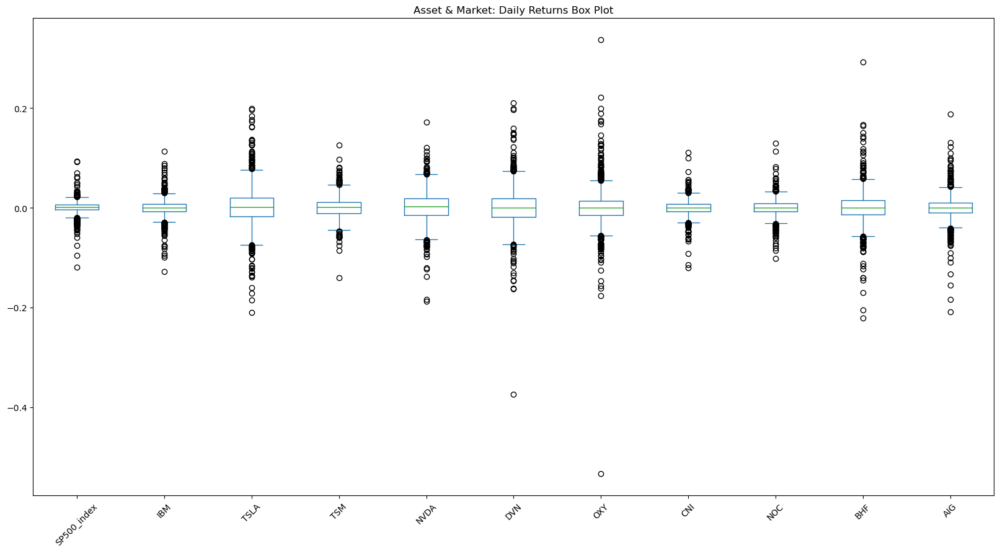

In [20]:
# Use the daily return data to create box plots to visualize the volatility of the assets 
asset_mkt_prices_returns_df.plot.box(
    figsize=(20, 10), 
    rot=45, 
    title = "Asset & Market: Daily Returns Box Plot"
)

In [21]:
# Sort the asset deviations
asset_mkt_prices_ann_std_sorted_df = asset_mkt_prices_ann_std_df.sort_values()

print("Asset annualized standard deviations (Sorted):")
display(asset_mkt_prices_ann_std_sorted_df)

Asset annualized standard deviations (Sorted):


SP500_index    0.207389
CNI            0.246134
IBM            0.273641
NOC            0.277375
TSM            0.334062
AIG            0.394690
NVDA           0.496845
BHF            0.525080
DVN            0.591464
OXY            0.619202
TSLA           0.636238
dtype: float64

In [22]:
# Dispaly the (sorted) asset sharpe ratios
print("Assets & Market: Annual Sharpe Ratio (Sorted):")
display(asset_prices_sharpe_ratio_df.sort_values())

asset_prices_sharpe_ratio_df.hvplot(
    kind = 'bar',
    width = 1000,
    height = 500,
    hover_color = 'magenta',
    rot = 45,
    title = "Assets & Market: Annual Sharpe Ratio")

Assets & Market: Annual Sharpe Ratio (Sorted):


IBM            0.041688
BHF            0.065452
AIG            0.087802
OXY            0.336608
CNI            0.388560
DVN            0.492438
NOC            0.523010
SP500_index    0.563151
TSM            0.690870
NVDA           0.828383
TSLA           1.116484
dtype: float64

:Bars   [index]   (0)

In [23]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_historical_df.drop(['SP500_index'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df)

market_df = pd.DataFrame(asset_mkt_prices_returns_df['SP500_index'])

# Recompute frequence components (e.g. covariance matrix will be different).
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_prices_df)

Asset Prices DataFrame (does not include market)


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,
2012-10-22,185.850861,1.856667,15.330000,2.992500,61.369999,79.337067,43.935001,70.199997,NaN,35.549999
2012-10-23,182.839386,1.892667,15.220000,3.082500,59.590000,77.871231,43.494999,69.660004,NaN,34.750000
2012-10-24,182.332703,1.828000,15.150000,3.042500,58.770000,77.296394,43.474998,69.330002,NaN,34.930000
2012-10-25,183.173996,1.834667,15.380000,3.045000,58.880001,79.059227,43.514999,69.040001,NaN,34.980000
2012-10-26,184.770554,1.825333,15.500000,3.012500,58.290001,77.066460,43.355000,68.019997,NaN,34.720001
...,...,...,...,...,...,...,...,...,...,...
2022-07-18,138.130005,240.546661,83.580002,161.009995,54.619999,60.049999,112.430000,449.260010,40.189999,49.889999
2022-07-19,130.880005,245.529999,86.150002,169.919998,57.209999,62.820000,115.430000,457.390015,41.650002,51.740002
2022-07-20,129.179993,247.500000,86.559998,178.070007,57.680000,63.549999,114.750000,456.070007,41.970001,51.520000


In [24]:
print("Annual Covariance Matrix:")
display(asset_mkt_prices_ann_cov_mtrx_df.head())

print("Correlation Matrix:")
display(asset_mkt_prices_ann_corr_mtrx_df)

Annual Covariance Matrix:


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
IBM,0.074879,0.038131,0.035675,0.047987,0.065968,0.068717,0.033188,0.032885,0.081009,0.056451
TSLA,0.038131,0.404799,0.083525,0.146870,0.093988,0.081129,0.044870,0.010689,0.091223,0.065474
TSM,0.035675,0.083525,0.111598,0.105448,0.067318,0.061243,0.036399,0.017558,0.073541,0.045829
NVDA,0.047987,0.146870,0.105448,0.246855,0.090380,0.070962,0.053845,0.031036,0.100914,0.063127
DVN,0.065968,0.093988,0.067318,0.090380,0.349829,0.283999,0.066418,0.041570,0.170792,0.127855


Correlation Matrix:


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
IBM,1.000000,0.219017,0.390258,0.352953,0.407588,0.405553,0.492758,0.433263,0.563801,0.522679
TSLA,0.219017,1.000000,0.392981,0.464615,0.249761,0.205932,0.286526,0.060568,0.273061,0.260729
TSM,0.390258,0.392981,1.000000,0.635314,0.340705,0.296071,0.442684,0.189486,0.419251,0.347582
NVDA,0.352953,0.464615,0.635314,1.000000,0.307555,0.230661,0.440301,0.225207,0.386816,0.321911
DVN,0.407588,0.249761,0.340705,0.307555,1.000000,0.775454,0.456231,0.253390,0.549939,0.547690
OXY,0.405553,0.205932,0.296071,0.230661,0.775454,1.000000,0.420654,0.296766,0.531399,0.530103
CNI,0.492758,0.286526,0.442684,0.440301,0.456231,0.420654,1.000000,0.362593,0.559680,0.521854
NOC,0.433263,0.060568,0.189486,0.225207,0.253390,0.296766,0.362593,1.000000,0.345868,0.347123
BHF,0.563801,0.273061,0.419251,0.386816,0.549939,0.531399,0.559680,0.345868,1.000000,0.785646
AIG,0.522679,0.260729,0.347582,0.321911,0.547690,0.530103,0.521854,0.347123,0.785646,1.000000


[Text(0.5, 1.0, 'Asset Prices Correlation Matrix')]

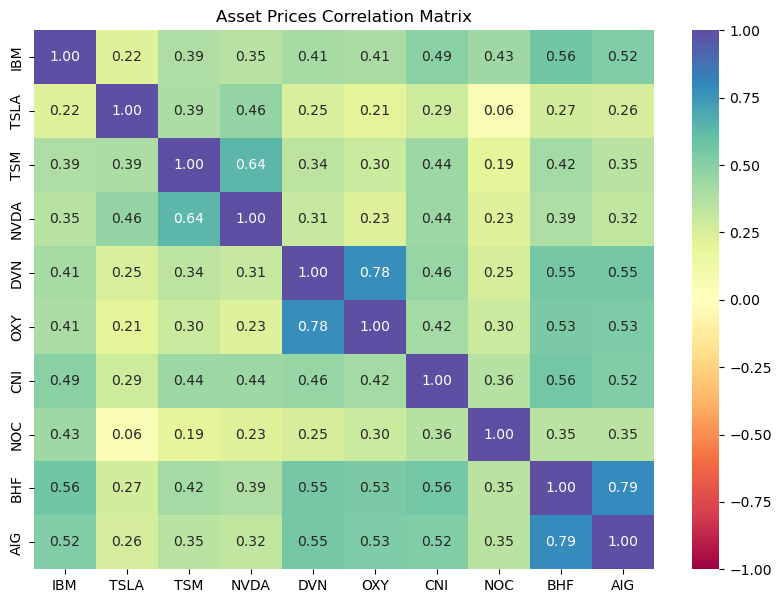

In [25]:
# Use the `heatmap` function from the seaborn library to visualize the correlation matrix
plt.figure(figsize = (10,7))
sns.heatmap(
    asset_mkt_prices_ann_corr_mtrx_df, 
    annot=True, 
    vmin=-1, 
    vmax=1, 
    fmt=".2f", 
    cmap="Spectral"
).set(
    title='Asset Prices Correlation Matrix')

In [26]:
print("Annual average asset returns:")
display(asset_mkt_prices_ann_returns_mean)

Annual average asset returns:


IBM     0.011407
TSLA    0.710350
TSM     0.230793
NVDA    0.411578
DVN     0.291259
OXY     0.208428
CNI     0.095638
NOC     0.145070
BHF     0.034367
AIG     0.034654
dtype: float64

___
### Efficient Frontier Computation

In [27]:
# Determine the efficient frontier components
efficient_frontier_df = qm.mpt_qa_get_efficient_frontier(asset_prices_df, asset_mkt_prices_ann_returns_mean, asset_mkt_prices_ann_cov_mtrx_df)

print("Efficient Frontier DataFrame:")
display(efficient_frontier_df.shape)

print("Print random 5 rows of Efficient Frontier sample points")
display(efficient_frontier_df.sample(5))

Efficient Frontier DataFrame:


(10000, 13)

Print random 5 rows of Efficient Frontier sample points


,Returns,Volatility,SharpeRatio,IBM_W,TSLA_W,TSM_W,NVDA_W,DVN_W,OXY_W,CNI_W,NOC_W,BHF_W,AIG_W
7987,0.263486,5.484713,0.042570,0.011973,0.183399,0.063003,0.003652,0.203170,0.124993,0.119054,0.093961,0.122070,0.074726
8149,0.243509,5.010874,0.042609,0.157269,0.063325,0.063950,0.217679,0.240574,0.019106,0.125550,0.022009,0.028063,0.062475
1669,0.212120,5.183090,0.035137,0.140801,0.097559,0.122346,0.025106,0.174924,0.126148,0.002557,0.130800,0.162891,0.016868
1055,0.202915,5.510151,0.031381,0.111557,0.042109,0.110229,0.078473,0.192597,0.184268,0.093940,0.036866,0.136178,0.013784
7540,0.226891,4.505602,0.043699,0.024577,0.079095,0.246340,0.157090,0.024202,0.053544,0.180151,0.048507,0.073439,0.113054


In [28]:
# Select the following portfolio allocations:
# (1) Based on the "minimum" risk
# (2) Based on the "maximum" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility, portfolio_max_volatility, portfolio_opt_sharpe_ratio = qm.mpt_qa_return_portfolio_allocations(efficient_frontier_df)

print("Efficient Frontier: Min Volatility Point:")
display(portfolio_min_volatility)
print("\nEfficient Frontier: Max Volatility Point:")
display(portfolio_max_volatility)
print("\nEfficient Frontier: Opt Sharpe Ratio Volatility Point:")
display(portfolio_opt_sharpe_ratio)

Efficient Frontier: Min Volatility Point:


Returns        0.182160
Volatility     3.679862
SharpeRatio    0.041349
IBM_W          0.112411
TSLA_W         0.077704
TSM_W          0.221215
NVDA_W         0.029883
DVN_W          0.022975
OXY_W          0.009862
CNI_W          0.178073
NOC_W          0.221914
BHF_W          0.032101
AIG_W          0.093861
Name: 3547, dtype: float64


Efficient Frontier: Max Volatility Point:


Returns        0.231311
Volatility     6.525974
SharpeRatio    0.030848
IBM_W          0.007454
TSLA_W         0.052426
TSM_W          0.075328
NVDA_W         0.016339
DVN_W          0.312137
OXY_W          0.263327
CNI_W          0.019488
NOC_W          0.121948
BHF_W          0.125159
AIG_W          0.006394
Name: 7226, dtype: float64


Efficient Frontier: Opt Sharpe Ratio Volatility Point:


Returns        0.422639
Volatility     6.054531
SharpeRatio    0.064851
IBM_W          0.005086
TSLA_W         0.412762
TSM_W          0.055298
NVDA_W         0.175650
DVN_W          0.006205
OXY_W          0.096459
CNI_W          0.068603
NOC_W          0.087268
BHF_W          0.083836
AIG_W          0.008834
Name: 383, dtype: float64

In [29]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the sharpe ratio points)
scatter = hv.Scatter(
    (
        efficient_frontier_df['Volatility'], 
        efficient_frontier_df['Returns'], 
        efficient_frontier_df.loc[:,'SharpeRatio']),
    'Volatility',
    ['Return', 'Sharpe Ratio'],
)
max_sharpe = hv.Scatter([(portfolio_opt_sharpe_ratio[1],portfolio_opt_sharpe_ratio[0])])
min_volatility = hv.Scatter([(portfolio_min_volatility[1],portfolio_min_volatility[0])])
max_volatility = hv.Scatter([(portfolio_max_volatility[1],portfolio_max_volatility[0])])

scatter.opts(title="Efficient Frontier + Min/Max/Opt Sharpe Ratio Selections", color='Sharpe Ratio', width=1000, height=600, colorbar=True, padding=0.1) *\
max_sharpe.opts(color='blue', line_color='black', size=15,) *\
min_volatility.opts(color='yellow', line_color='black', size=15) *\
max_volatility.opts(color='red', line_color='black', size=15)


:Overlay
   .Scatter.I   :Scatter   [Volatility]   (Return,Sharpe Ratio)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)
   .Scatter.IV  :Scatter   [x]   (y)

### Visualization for: "mpt_performance_eval.py"

In [30]:
# Select the following portfolio allocations:
# (1) Based on the "minimum volatility" risk
# (2) Based on the "maximum returns" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_min_volatility)
portfolio_max_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_max_volatility)
portfolio_opt_sharpe_ratio_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_opt_sharpe_ratio)

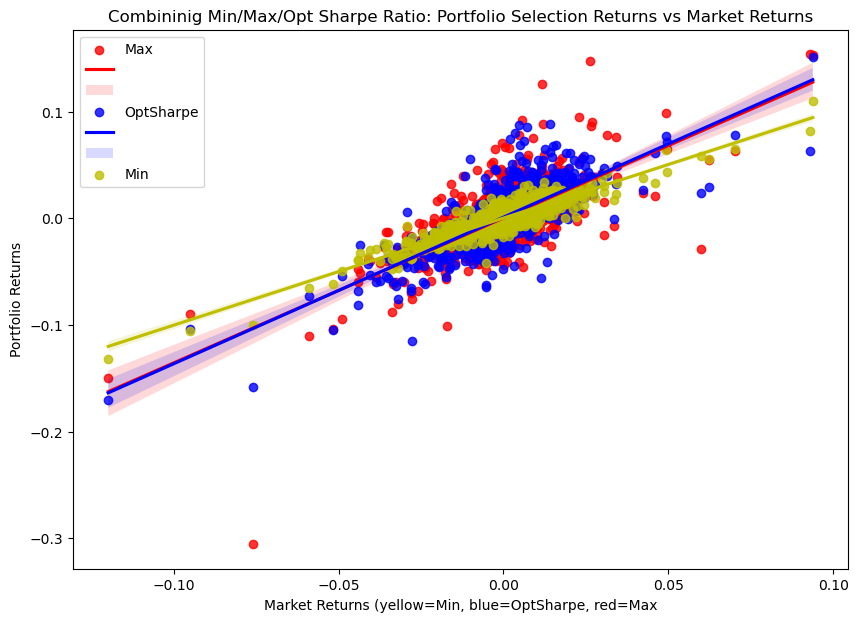

In [31]:
plt.subplots(figsize=(10,7))

x_df = market_df.reset_index(drop=True)
y_df = portfolio_max_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MaxVol"]
sns.regplot(x="Market", y="MaxVol", data=z_df, color='r')

y_df = portfolio_opt_sharpe_ratio_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "OptSharpe"]
sns.regplot(x="Market", y="OptSharpe", data=z_df, color='b')

y_df = portfolio_min_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MinReturns"]
sns.regplot(x="Market", y="MinReturns", data=z_df, color='y')

plt.xlabel("Market Returns (yellow=Min, blue=OptSharpe, red=Max")
plt.ylabel("Portfolio Returns")
plt.legend(["Max", "", "", "OptSharpe", "", "", "Min"])
plt.title("Combininig Min/Max/Opt Sharpe Ratio: Portfolio Selection Returns vs Market Returns")

plt.show()

In [32]:
portfolio_min_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_min_volatility)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_min_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Minimum / Lowest risk tolerant Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

In [33]:
portfolio_opt_sharpe_ratio_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_opt_sharpe_ratio)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_opt_sharpe_ratio_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Balanced; Optimal Sharpe Ratio Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

In [34]:
portfolio_max_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_max_volatility)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_max_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Max return, High risk tolerant Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

### Compute Actual Realized Portfolio Value under the Test dataframe components

In [35]:
asset_prices_test_beg_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_historical_days_percent, :]).drop('SP500_index', axis=0, inplace=False)
asset_prices_test_end_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_days_total-1, :]).drop('SP500_index', axis=0, inplace=False)

print("Beginning and end dates used for the testing the performance of the portfolio")
display(asset_prices_test_beg_df.T)
display(asset_prices_test_end_df.T)

Beginning and end dates used for the testing the performance of the portfolio


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
2022-07-26,128.080002,258.859985,84.419998,165.330002,56.759998,62.07,116.790001,444.649994,41.459999,51.73


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
2022-10-21,129.899994,214.440002,63.75,124.660004,74.290001,71.260002,112.82,522.659973,52.150002,53.25


___
### Monte-Carlo Dataframe Weights List

In [36]:
# Arrange Monte Carlo dataframe weights list
portfolio_mc_min_weights = mpt.mpt_pe_get_mc_weights(portfolio_min_weights)
portfolio_mc_opt_sharpe_ratio_weights = mpt.mpt_pe_get_mc_weights(portfolio_opt_sharpe_ratio_weights)
portfolio_mc_max_weights = mpt.mpt_pe_get_mc_weights(portfolio_max_weights)

In [37]:
investment_pnl_min = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_min_weights))[0][0]
investment_pnl_opt_sharpe_ratio = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_opt_sharpe_ratio_weights))[0][0]
investment_pnl_max = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_max_weights))[0][0]

print("Actual realized portfolio value for low-risk tolerance/Balanced or opt_Sharpe allocations/high-risk tolerance:")
display(investment_pnl_min)
display(investment_pnl_opt_sharpe_ratio)
display(investment_pnl_max)

Actual realized portfolio value for low-risk tolerance/Balanced or opt_Sharpe allocations/high-risk tolerance:


9840.219841003418

9334.740089416504

11747.4301071167

### Run Monte-Carlo Simulations
---
* Compute expected Returns, and 
* Compare against realized returns

In [38]:
print("Number of MC runs:", mpt.num_mc_runs)

Number of MC runs: 1200


In [39]:
# Slice the "test" dataframe to use for MC sims to predict returns
asset_mc_test_df = asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False)

In [40]:
# Arrange Monte-Carlo dataframe to have tuples for column names
asset_prices_mc_col_df = mpt.mpt_pe_get_mc_porfolio_df(asset_mc_test_df)

In [41]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the minimum risk portfolio weights
# Run 500 samples.
MC_min_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_min_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Min)")
MC_min_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Min)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [42]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (min)
MC_min_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.004116,0.998673,1.008500,0.992496,0.994445,1.003080,0.995403,0.979629,1.005761,1.002076,...,1.005104,0.998839,0.992532,1.008181,1.003683,0.989880,1.000478,1.005719,0.985319,0.997706
2,0.991377,0.985282,1.008466,0.997484,0.992255,1.001891,0.980563,0.980007,1.015450,1.003829,...,1.006286,1.000075,1.000056,0.993153,0.999842,0.981830,0.994036,1.008354,0.970186,0.993330
3,0.983794,0.988229,1.003892,1.000161,1.002462,0.997469,0.977166,0.958584,1.023368,1.023533,...,1.003651,1.005430,1.003065,1.000737,0.988246,0.991375,1.010839,1.009554,0.977245,0.996970
4,0.968625,0.975246,1.010304,0.990366,1.013846,1.011985,0.963448,0.957375,1.029447,1.028844,...,0.993665,0.995815,1.008845,0.999741,1.001870,0.997048,1.006202,1.003589,0.998370,0.998697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.988810,0.944293,0.948670,0.932404,0.886483,0.912445,0.917445,0.915855,0.961049,0.881685,...,0.937911,0.948354,0.929252,0.995725,0.958135,0.942792,1.114575,0.945605,0.818272,0.907749
60,0.996119,0.942077,0.949881,0.923408,0.886261,0.911784,0.916616,0.898070,0.959573,0.876245,...,0.932689,0.945833,0.938414,0.985529,0.944423,0.958195,1.115937,0.946967,0.829823,0.906888
61,0.991178,0.934074,0.945835,0.927117,0.878649,0.908381,0.921972,0.900340,0.969022,0.892618,...,0.932269,0.947094,0.931826,0.979993,0.929617,0.951115,1.126064,0.925515,0.840151,0.921510
62,0.990121,0.940460,0.963102,0.916762,0.885100,0.898831,0.924226,0.895294,0.968052,0.890892,...,0.935598,0.954696,0.935614,0.981607,0.921012,0.949249,1.105139,0.929944,0.832841,0.926136


In [43]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the maximum return risk-tolerant portfolio weights
# Run 500 samples.
MC_max_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_max_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Max)")
MC_max_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Max)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [44]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (max)
MC_max_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.030733,0.993685,0.975633,0.989725,0.992660,1.008156,1.018654,0.963440,1.000006,0.994807,...,0.986108,1.016639,0.996126,0.999964,1.006917,0.979457,0.991808,0.998770,1.017915,1.001521
2,1.036853,0.978544,0.976314,1.004419,0.977906,1.002262,1.020660,0.961451,1.004071,0.981892,...,0.997942,0.994988,1.006401,0.982614,1.015372,0.989894,0.976406,0.993128,1.012567,1.007325
3,1.031908,0.982235,0.972587,1.009418,0.994957,0.975041,1.014959,0.962339,1.012357,0.968829,...,1.009374,0.999250,1.012347,0.989682,1.028737,1.016494,0.964986,1.009900,1.013194,0.999597
4,1.039040,0.987517,0.976372,1.006138,1.032738,0.963060,0.995414,0.945686,1.002970,0.952548,...,1.020760,1.004476,1.028803,0.999465,1.028219,1.013834,0.968319,0.997776,1.021914,1.002321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,1.084664,1.117581,1.052930,1.083167,1.149603,1.033981,1.203944,1.003178,1.313941,1.267122,...,0.991567,1.059872,1.204794,1.057541,1.310564,1.032877,1.202253,1.200716,1.024589,1.129487
60,1.074711,1.134427,1.054367,1.081979,1.129206,1.058971,1.204440,1.001223,1.335878,1.237922,...,0.998227,1.065670,1.193989,1.072775,1.332964,1.051164,1.223630,1.188035,1.018364,1.122213
61,1.068436,1.149081,1.045780,1.078858,1.110778,1.053874,1.186724,0.987386,1.306536,1.227624,...,1.004598,1.063930,1.199915,1.090151,1.330911,1.024175,1.212802,1.171197,1.029429,1.117749
62,1.086450,1.192037,1.044048,1.079880,1.091762,1.053335,1.182647,1.005170,1.329471,1.230869,...,1.020285,1.083751,1.236917,1.087678,1.331175,1.028378,1.231195,1.196742,1.024001,1.075572


In [45]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the optimal risk-return Sharpe Ratio of the portfolio
# Run 500 samples.

MC_opt_sharpe_ratio_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_opt_sharpe_ratio_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Opt Sharpe)")
MC_opt_sharpe_ratio_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Opt Sharpe)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [46]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns of the optimal (balanced) Sharpe Ratio
MC_opt_sharpe_ratio_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.987474,0.988954,0.995415,1.005851,1.001961,1.014175,0.999730,1.015305,0.976620,1.024487,...,0.990543,0.973003,0.986867,0.988727,0.987747,0.990903,1.022952,0.999445,0.977970,0.998877
2,1.004921,1.001222,0.966957,1.027345,1.003201,1.005012,1.003234,1.022573,0.998759,1.048269,...,0.988559,0.993939,0.981987,1.017380,0.987964,0.955568,1.017998,1.000735,0.971875,0.993115
3,1.020914,0.983083,0.964959,1.008869,0.979168,0.995745,0.998288,1.009592,1.011801,1.047676,...,0.980391,0.996418,0.990838,0.994361,0.988670,0.952371,1.023794,0.981909,0.957422,1.008601
4,1.011065,1.002114,0.949499,1.038113,0.985096,0.973635,1.006182,1.048398,1.019944,1.052354,...,0.984005,1.008054,0.993927,0.999835,1.011691,0.934586,1.035304,1.012231,0.926370,0.997715
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.932153,0.846739,0.815849,0.807104,0.870715,0.917513,0.810648,1.027460,1.058648,0.783050,...,0.753114,0.903946,0.944633,0.967824,0.848968,0.960965,1.023467,0.943670,0.787368,0.864734
60,0.909084,0.871441,0.806316,0.810010,0.907872,0.917406,0.786661,1.020846,1.047413,0.788442,...,0.746627,0.911826,0.937600,0.974721,0.836056,0.986272,1.029879,0.942186,0.783160,0.867576
61,0.922709,0.859434,0.807001,0.793581,0.918535,0.911845,0.767437,1.032773,1.050459,0.803202,...,0.735379,0.930331,0.912973,0.964337,0.823288,0.979091,1.036969,0.933720,0.788729,0.846095
62,0.909445,0.860836,0.811840,0.795250,0.929666,0.907722,0.765770,1.025260,1.049893,0.790443,...,0.743410,0.919299,0.910874,0.965842,0.821945,0.969818,1.029192,0.954441,0.801619,0.844945


### 4. Visualizations

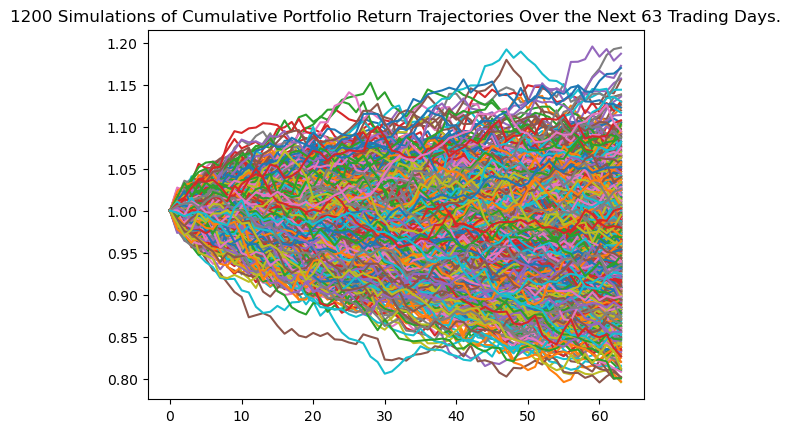

In [47]:
# Visualize the 1 year Monte Carlo simulation by creating an overlay line plot

line_plot_min_portfolio_plot = MC_min_portfolio.plot_simulation()

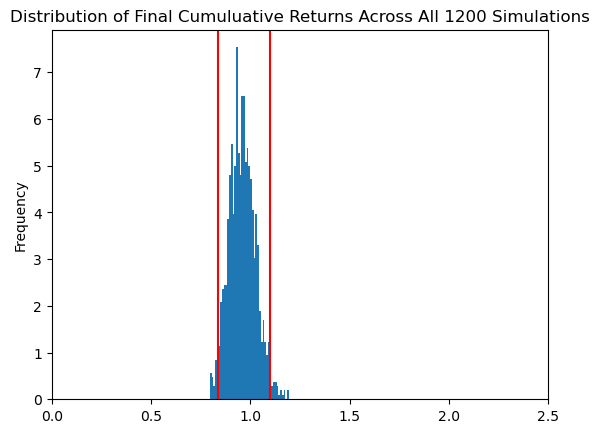

In [48]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_min_portfolio_plot = MC_min_portfolio.plot_distribution()

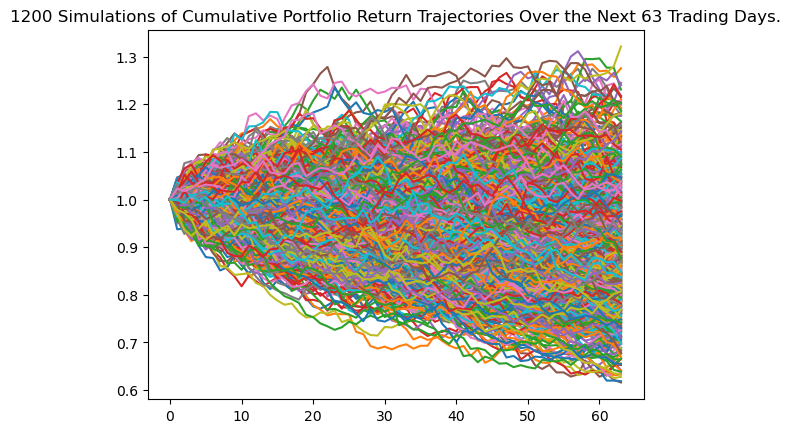

In [49]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_simulation()

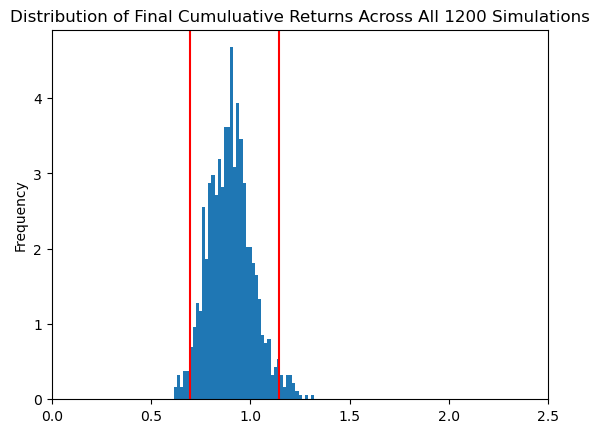

In [50]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_distribution()

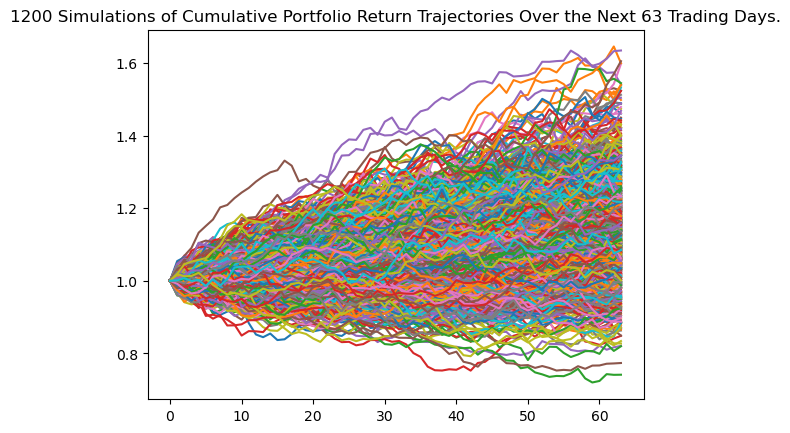

In [51]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_max_portfolio_plot = MC_max_portfolio.plot_simulation()

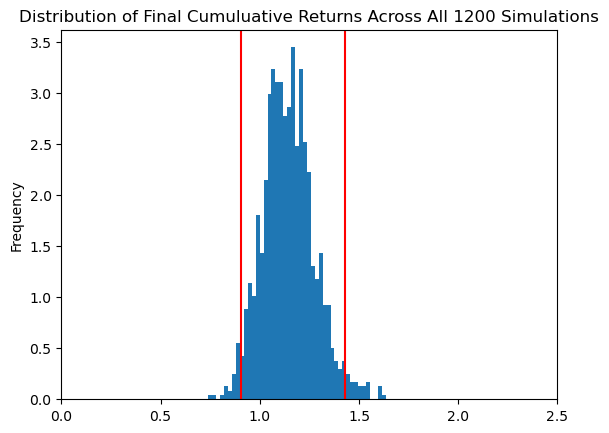

In [52]:
# Visualize the probability distribution of the 1 year Monte-Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_max_portfolio_plot = MC_max_portfolio.plot_distribution()

In [53]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_min_portfolio_weight = MC_min_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_min_portfolio_weight)

count           1200.000000
mean               0.959646
std                0.066653
min                0.795878
25%                0.912447
50%                0.958256
75%                1.003141
max                1.194140
95% CI Lower       0.836402
95% CI Upper       1.097300
Name: 63, dtype: float64


In [54]:
# Generate summary statistics from the 1 year Monte Carlo simulation results
# Save the results as a variable
table_opt_sharpe_ratio_portfolio_weight = MC_opt_sharpe_ratio_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_opt_sharpe_ratio_portfolio_weight)

count           1200.000000
mean               0.900356
std                0.111852
min                0.615733
25%                0.821375
50%                0.898710
75%                0.967430
max                1.321521
95% CI Lower       0.698390
95% CI Upper       1.145520
Name: 63, dtype: float64


In [55]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_max_portfolio_weight = MC_max_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_max_portfolio_weight)

count           1200.000000
mean               1.143978
std                0.129878
min                0.741375
25%                1.056586
50%                1.138576
75%                1.222573
max                1.634119
95% CI Lower       0.905402
95% CI Upper       1.427757
Name: 63, dtype: float64


In [56]:
# Print the initial investment in the portfolio
print(f"The initial investment of the portfolio is ${mpt.initial_test_investment:0.2f}")

The initial investment of the portfolio is $10000.00


In [57]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MIN portfolio

# Get the lower and upper CI values
ci_lower_95per = table_min_portfolio_weight[8]
ci_upper_95per = table_min_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2)

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current minimum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_min:0.2f}")


There is a 95% chance that the current minimum portfolio value of $10000.00, will end within the range of $8364.02 and $10973.00.
The actual realized value of the portfolio was $9840.22


In [58]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the OPT SHARPE RATIO portfolio

# Get the lower and upper CI values
ci_lower_95per = table_opt_sharpe_ratio_portfolio_weight[8]
ci_upper_95per = table_opt_sharpe_ratio_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltive returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_opt_sharpe_ratio:0.2f}")


There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of $10000.00, will end within the range of $6983.90 and $11455.20.
The actual realized value of the portfolio was $9334.74


In [59]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MAX portfolio

# Get the lower and upper CI values
ci_lower_95per = table_max_portfolio_weight[8]
ci_upper_95per = table_max_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2)
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current maximum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_max:0.2f}")


There is a 95% chance that the current maximum portfolio value of $10000.00, will end within the range of $9054.02 and $14277.57.
The actual realized value of the portfolio was $11747.43


In [60]:
# ending process
end_time = time.process_time()
print("Process time", end_time - start_time)

Process time 30.499661
